# Xenium registration

In [2]:
import numpy as np
%matplotlib notebook
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import cm
from matplotlib.lines import Line2D
import os
import glob
import torch

from scipy.stats import rankdata
import time

import imp
import tools
imp.reload(tools)

<module 'tools' from '/Users/jeanfan/Desktop/STalign/tools.py'>

In [40]:
# Single cell data 1
fname = '/Users/jeanfan/Desktop/STalign/xenium_data/Xenium_FFPE_Human_Breast_Cancer_Rep1_cells.csv.gz'
df = pd.read_csv(fname)
df.head()

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area
0,1,377.663005,843.541888,154,0,0,154,110.361875,45.562656
1,2,382.078658,858.944818,64,0,0,64,87.919219,24.248906
2,3,319.839529,869.196542,57,0,0,57,52.561875,23.526406
3,4,259.304707,851.797949,120,0,0,120,75.230312,35.176719
4,5,370.576291,865.193024,120,0,0,120,180.218594,34.499375


<IPython.core.display.Javascript object>


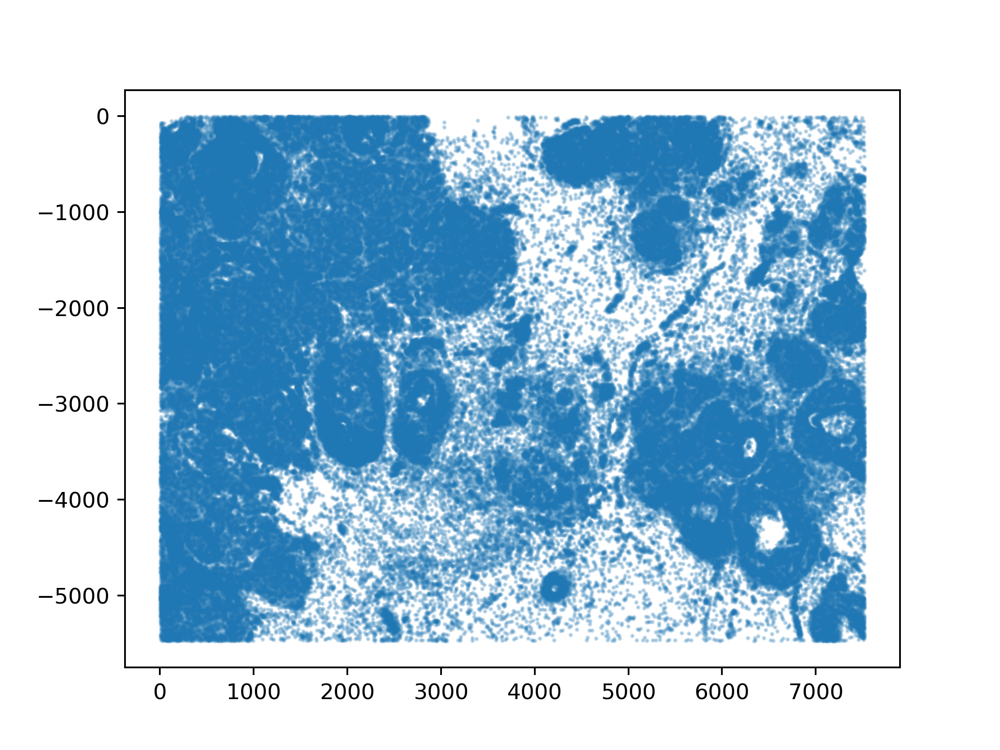

<IPython.core.display.Javascript object>


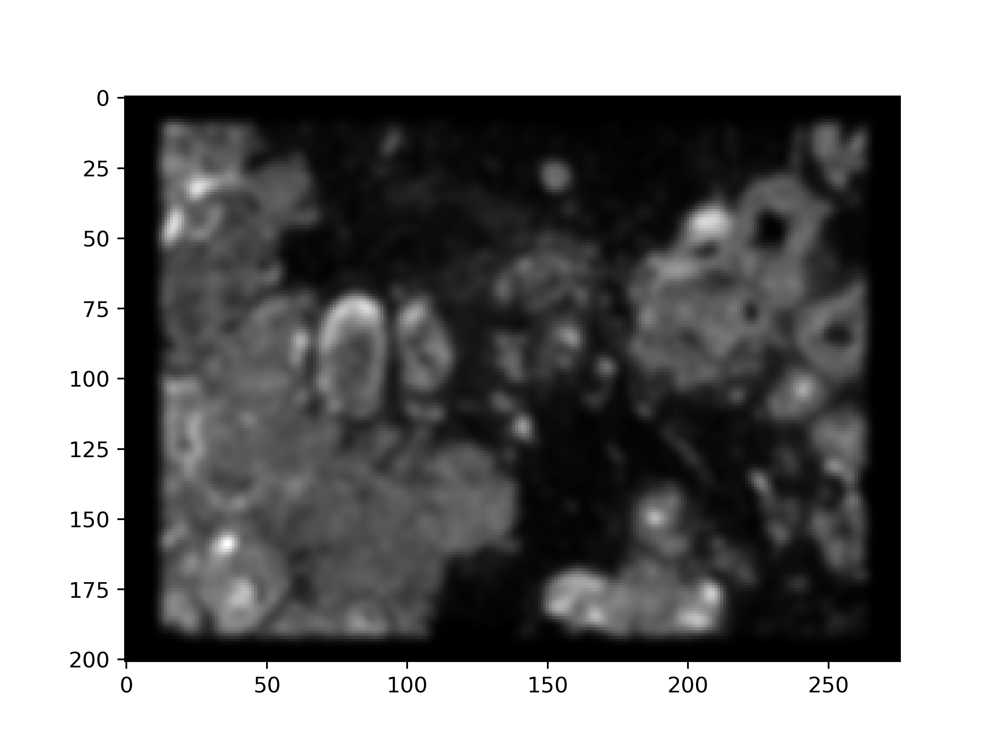

0 of 167782
10000 of 167782
20000 of 167782
30000 of 167782
40000 of 167782
50000 of 167782
60000 of 167782
70000 of 167782
80000 of 167782
90000 of 167782
100000 of 167782
110000 of 167782
120000 of 167782
130000 of 167782
140000 of 167782
150000 of 167782
160000 of 167782
167781 of 167782


In [41]:
xI = np.array(df['x_centroid'])
yI = np.array(-df['y_centroid'])

fig,ax = plt.subplots()
ax.scatter(xI,yI,s=1,alpha=0.25)

XI,YI,I,fig = tools.rasterize(xI,yI)
ax = fig.axes[0]

<IPython.core.display.Javascript object>


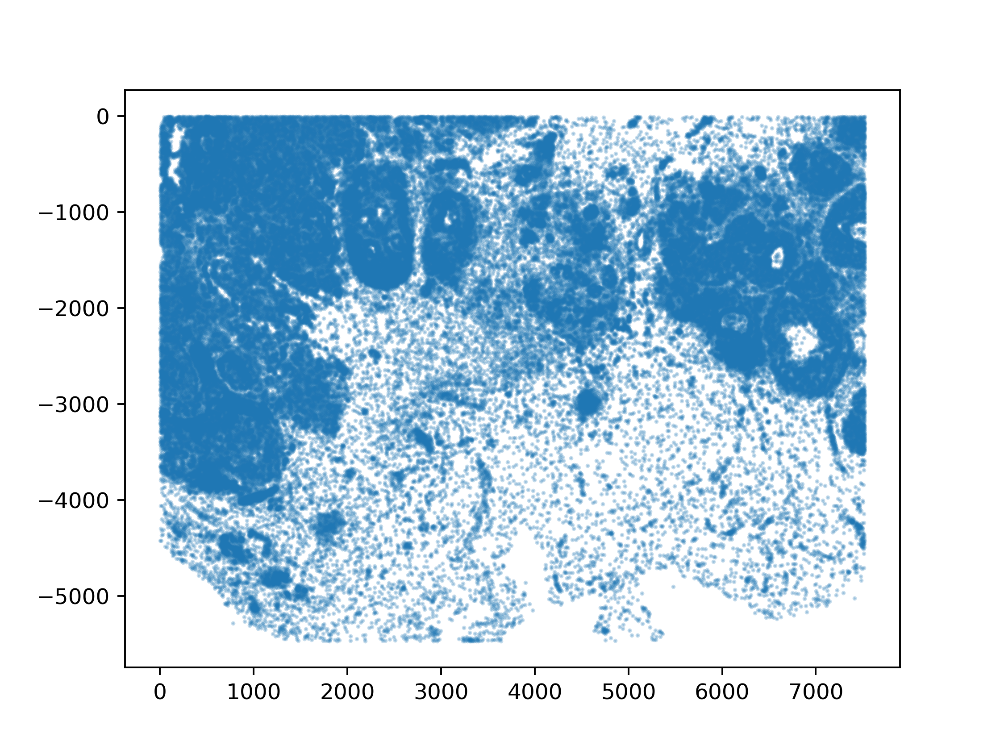

<IPython.core.display.Javascript object>


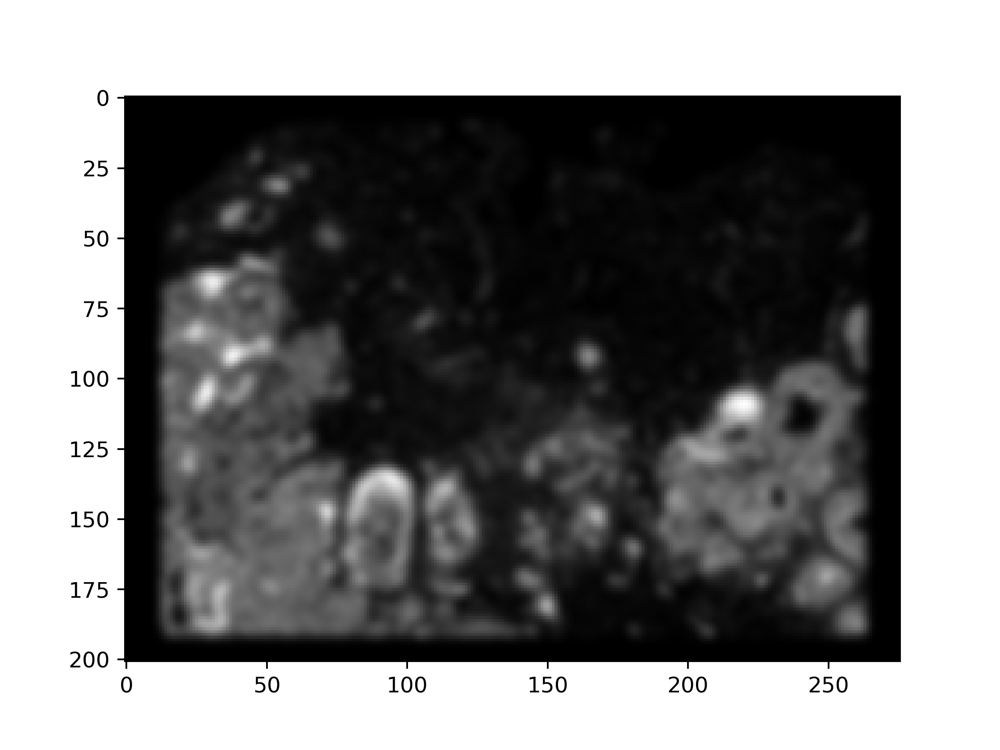

0 of 118752
10000 of 118752
20000 of 118752
30000 of 118752
40000 of 118752
50000 of 118752
60000 of 118752
70000 of 118752
80000 of 118752
90000 of 118752
100000 of 118752
110000 of 118752
118751 of 118752


In [42]:
fname = '/Users/jeanfan/Desktop/STalign/xenium_data/cells.csv.gz'
df = pd.read_csv(fname)
df.head()

xJ = np.array(df['x_centroid'])
yJ = np.array(-df['y_centroid'])

fig,ax = plt.subplots()
ax.scatter(xJ,yJ,s=1,alpha=0.25)

XJ,YJ,J,fig = tools.rasterize(xJ,yJ)
ax = fig.axes[0]

<IPython.core.display.Javascript object>


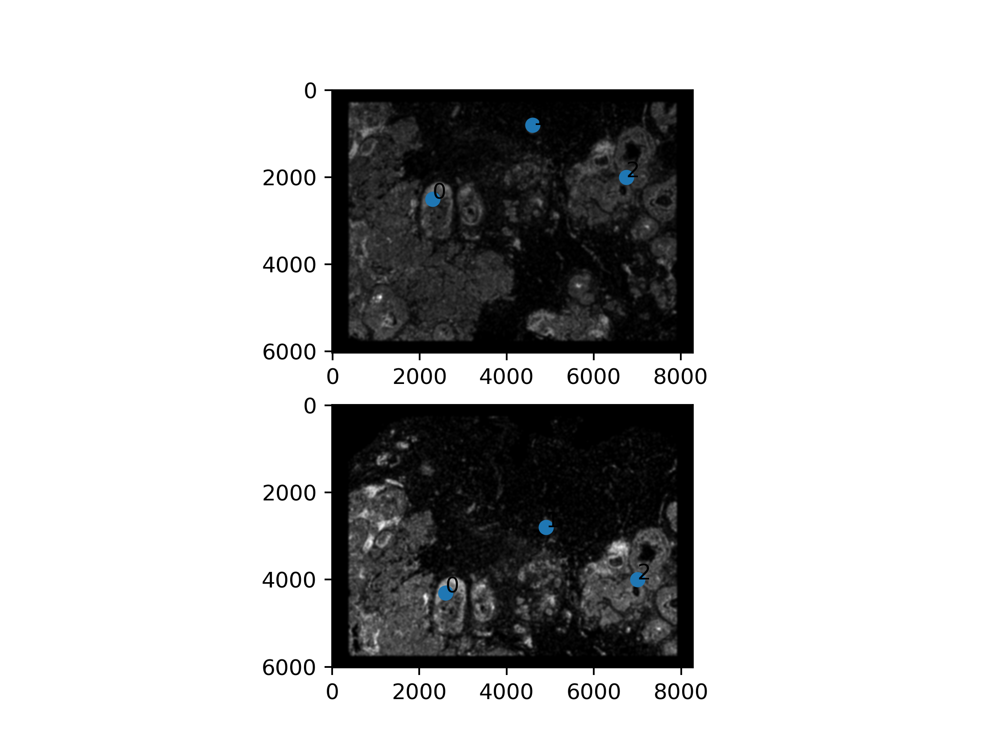

In [47]:
# jean's hack for dealing with imshow error NxMx1 is not valid
foo = np.vstack((M, M, M))
foo.shape

bar = np.vstack((M2, M2, M2))
bar.shape

I = tools.normalize(foo)
YI = np.array(range(I.shape[1]))*10.
XI = np.array(range(I.shape[2]))*10.

J = tools.normalize(bar)
YJ = np.array(range(J.shape[1]))*10.
XJ = np.array(range(J.shape[2]))*10.

extentI = tools.extent_from_x((YI,XI))
extentJ = tools.extent_from_x((YJ,XJ))

# manually make points
pointsI = np.array([[250,230], [80,460], [200,675]])*10.
pointsJ = np.array([[430,260], [280,490], [400,700]])*10.

# plot
fig,ax = plt.subplots(2,1)
ax[0].imshow((I).transpose(1,2,0).squeeze(), extent=extentI)
ax[1].imshow((J).transpose(1,2,0), extent=extentJ)

ax[0].scatter(pointsI[:,1],pointsI[:,0])
ax[1].scatter(pointsJ[:,1],pointsJ[:,0])
for i in range(pointsI.shape[0]):
    ax[0].text(pointsI[i,1],pointsI[i,0],f'{i}')
    ax[1].text(pointsJ[i,1],pointsJ[i,0],f'{i}')

<IPython.core.display.Javascript object>


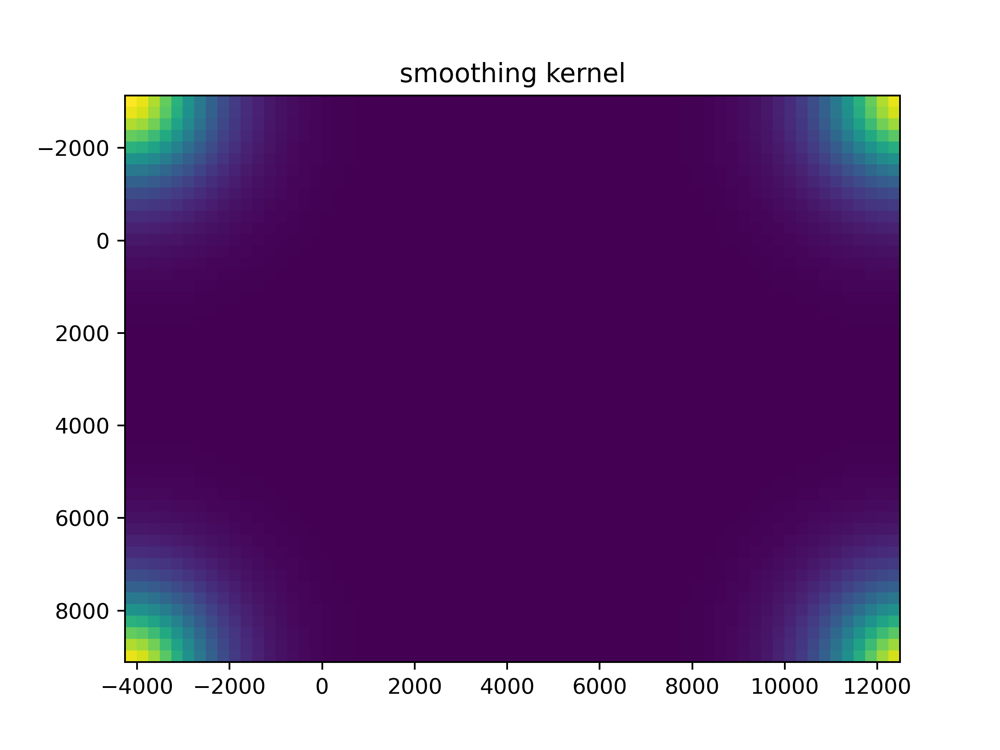

<IPython.core.display.Javascript object>


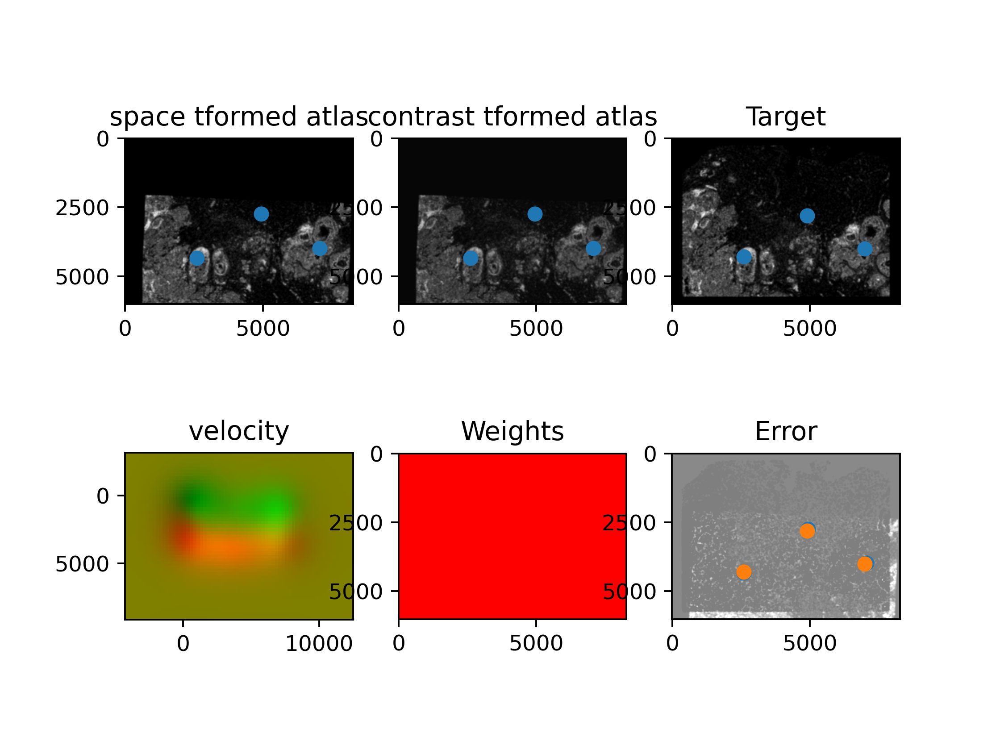

<IPython.core.display.Javascript object>


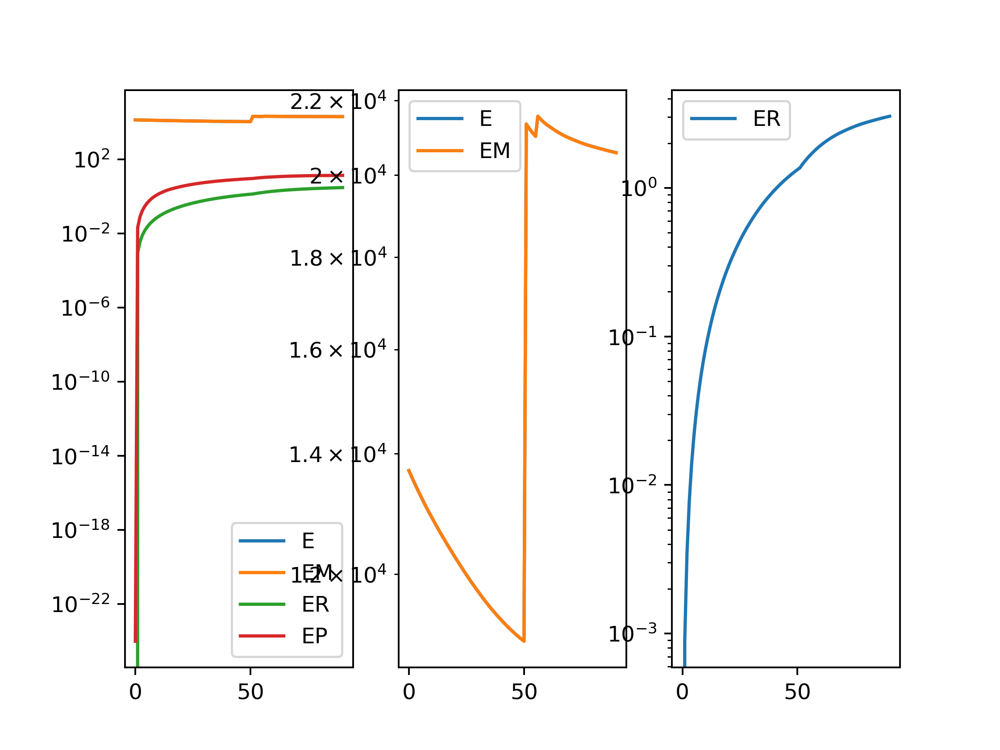

In [70]:
imp.reload(tools)
L,T = tools.L_T_from_points(pointsI,pointsJ)
device = 'cpu'
params = {'L':L,'T':T,
          'niter':100,
          'pointsI':pointsI,
          'pointsJ':pointsJ,
          'device':device,
          'sigmaM':0.5,
          'epV': 100
          }

A,v,xv = tools.LDDMM([YI,XI],I,[YJ,XJ],J,**params)

In [79]:
print(A)
print(extentI)
print(extentJ)

tensor([[ 9.4053e-01,  3.6273e-02,  1.8798e+03],
        [-2.0132e-02,  9.8928e-01,  3.7453e+02],
        [ 0.0000e+00,  0.0000e+00,  1.0000e+00]], dtype=torch.float64)
(-5.0, 8275.0, 6025.0, -5.0)
(-5.0, 8275.0, 6015.0, -5.0)


<IPython.core.display.Javascript object>


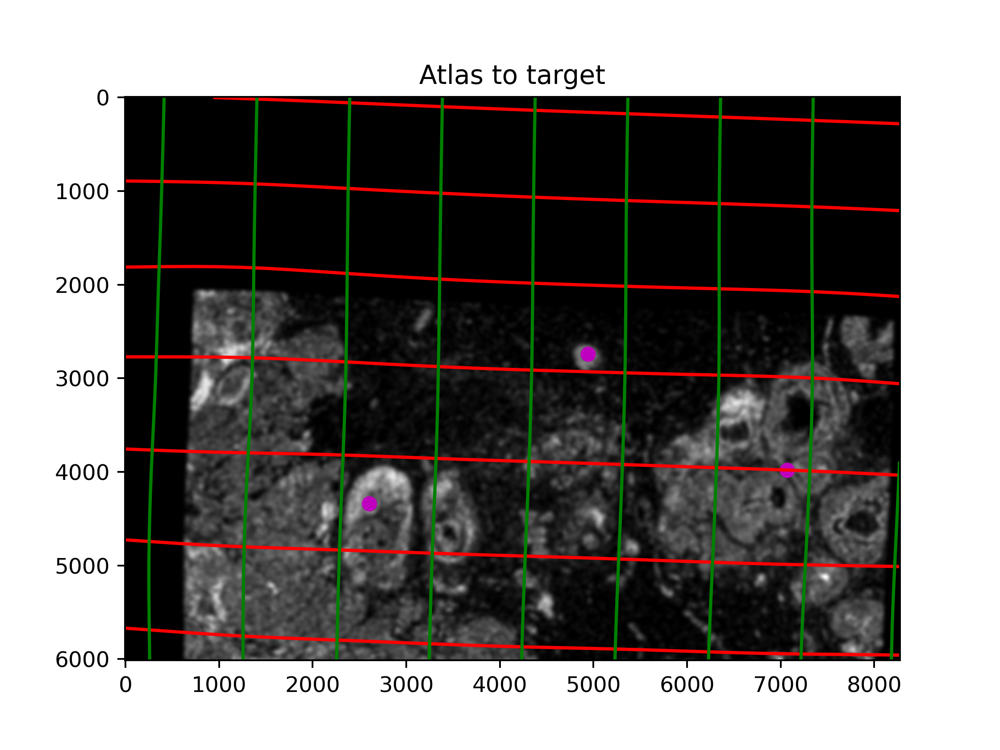

In [71]:
# apply transform
levels = np.arange(-100000,100000,1000)

fig,ax = plt.subplots()
phii = tools.build_transform(xv,v,A,XJ=[YJ,XJ],direction='b')
phiI = tools.transform_image_atlas_to_target(xv,v,A,[YI,XI],I,[YJ,XJ])
phipointsI = tools.transform_points_atlas_to_target(xv,v,A,pointsI)

ax.contour(XJ,YJ,phii[...,0],colors='r',linestyles='-',levels=levels)
ax.contour(XJ,YJ,phii[...,1],colors='g',linestyles='-',levels=levels)
ax.set_aspect('equal')
ax.set_title('Atlas to target')

ax.imshow(phiI.permute(1,2,0)/torch.max(phiI),extent=extentJ)
ax.scatter(phipointsI[:,1].detach(),phipointsI[:,0].detach(),c="m")

<IPython.core.display.Javascript object>


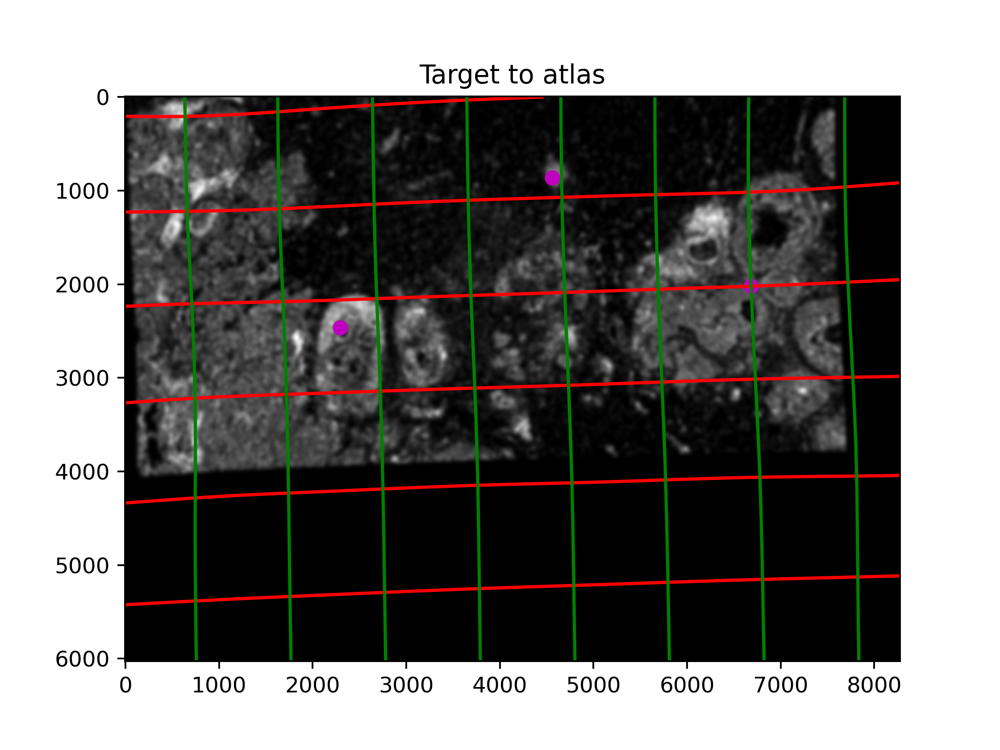

In [72]:
levels = np.arange(-100000,100000,1000)

fig,ax = plt.subplots()
phi = tools.build_transform(xv,v,A,XJ=[YI,XI],direction='f')
phiiJ = tools.transform_image_target_to_atlas(xv,v,A,[YJ,XJ],J,[YI,XI])
phiipointsJ = tools.transform_points_target_to_atlas(xv,v,A,pointsJ)

ax.contour(XI,YI,phi[...,0],colors='r',linestyles='-',levels=levels)
ax.contour(XI,YI,phi[...,1],colors='g',linestyles='-',levels=levels)
ax.set_aspect('equal')
ax.set_title('Target to atlas')

ax.imshow(phiiJ.permute(1,2,0)/torch.max(phiiJ),extent=extentI)
ax.scatter(phiipointsJ[:,1].detach(),phiipointsJ[:,0].detach(),c="m")

In [85]:
tpointsI = np.stack([yI+6025.0-6025.0/10*0.1, xI+8275.0/10*0.1])
tpointsI[1,:]


array([ 460.41300507,  464.82865753,  402.58952942, ..., 7552.86958008,
       7560.45400391, 7572.1265625 ])

<IPython.core.display.Javascript object>


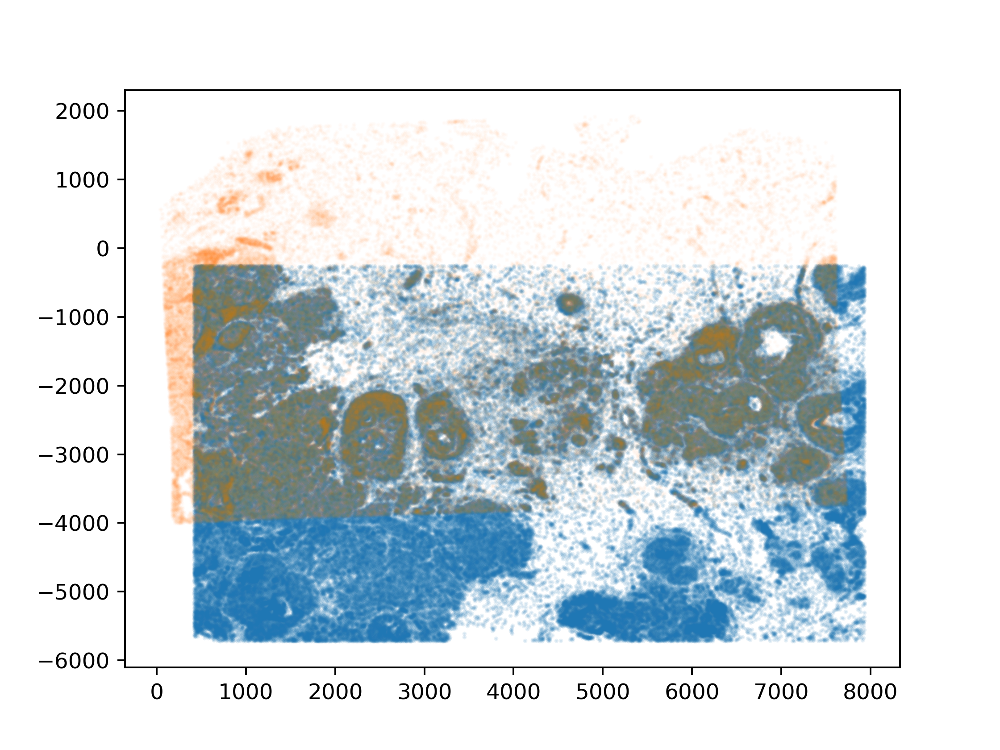

In [97]:
# Now apply to points (need help here...but in theory doable)
fig,ax = plt.subplots()
tpointsI = np.stack([yI+6025.0-6025.0/10*0.5, xI+8275.0/10*0.5])
tpointsJ = tools.transform_points_target_to_atlas(xv,v,A,np.stack([yJ+6015.0-6015.0/10*0.5, xJ+8275.0/10*0.5], 1))

#ax.imshow((I).transpose(1,2,0),extent=extentI)
ax.scatter(tpointsI[1,:],-tpointsI[0,:],s=1,alpha=0.1)
ax.scatter(tpointsJ[:,1].detach(),-tpointsJ[:,0].detach(),s=1,alpha=0.02)

In [ ]:
# Conclusion: looks good! Mostly linear transformation it seems though